# Grafo - Acadêmicos

Esse projeto consiste em coletar dados de acadêmicos, seus estudantes e seus orientadores da internet. A partir disso construir análises e visualizar as conexões entre eles por meio de grafos.

O projeto foi motivado pela disciplina de Grafos Aleatórios do Departamento de Estatística da UFMG.

O projeto vai ser dividido em quatro partes:

- Coleta dos dados
- Pré-Processamento dos dados
- Análise
- Visualizações

# Descrição do Projeto

## 1. Coleta de Dados

A coleta dos dados foi feita por meio de uma raspagem de dados da Wikipedia *(All Wikipedia text is available under the Creative Commons Attribution-ShareAlike License (CC-BY-SA) )*. Os dados foram coletados da wikipedia em língua inglesa por ser a com mais artigos, dessa maneira a mais completa e com mais páginas.

O processo é feito por meio de uma requisição de um link da wikipedia e um desmembramento da página HTML por meio de um parser da biblioteca beautiful soup.

### Estrutura das páginas

Na página da wikipedia de muitos dos acadêmicos, temos um quadro a esquerda, trazendo algumas informações sobre eles. A parte mais importante para nós é a que informa sobre Academic Advisor e Notable Students.

<center><img src="imagens\pag_wikipedia.png"/></center>

Ao longo da coleta de dados de uma página, coletamos, além de algumas de suas informações, o link da wikipedia dos estudantes e orientadores dessa pessoa quando disponível. As informações que coletamos além disso são:
- Ano de Nascimento (Regex a de 4 dígitos a partir da aba Born) 
- O país de Nascimento (Tudo após a última vírgula da aba Born)
- Campo Principal de Atuação (Primeiro campo da aba Fields)

Vale ressaltar que o exemplo apresentado com Newton é de um dos Físicos/Matemáticos mais famosos de todos os tempos, dessa maneira os dados são completos e estruturados, quando partimos para níveis mais profundos da coleta, existem várias estruturas diferentes e problemas que surgem, tratados no pré-processamento.

### Inicialização

Os links iniciais foram definidos a mão, com o objetivo de escolher pessoas famosas no meio científico. Foram 14 pessoas, divididas em 5 áreas das ciências exatas:

<center><img src="imagens\fisicos.png"/></center>
<center><img src="imagens\matematicos.png"/></center>
<center><img src="imagens\estatisticos.png"/></center>
<center><img src="imagens\quimicos.png"/></center>
<center><img src="imagens\cientistas_computacao.png"/></center>

Alfred Nobel não tem conexões, ele não era do meio acadêmico, dessa maneira ele deve ficar sozinho o tempo todo.

Inicialmente, coletamos sequencialmente as informações dos membros originais (incluindo os links dos estudantes e orientadores). Ao coletar todos os originais, começamos a coletar informações dos links que foram coletados em ordem aleatória, a cada execução adicionamos mais links e sempre mantemos o próximo aleatório. 

<center><img src="imagens\fluxo_coleta.png"/></center>

O valor de N inicial, foi definido como 10000, visitamos 10000 páginas e coletamos as informações quando possível.

## 2. Pré-Processamento

Essa parte consiste em tratar inconsistências nos dados. Devido a fonte e o método de coleta dos dados, muitas vezes a estrutura da página acessada não tem o mesmo padrão ou a mesma informação que estamos buscando. Dessa maneira foi necessário fazer algumas tratativas.

As principais tratativas foram em relação ao local de nascimento, apesar de reconhecer que não se trata da mesma nação devido a diversas transformações da sociedade, tomei a decisão de traduzir nações do passado para sua atual configuração da maneira que consegui. Além disso muitas vezes estados e cidades estavam listados no local do país devido a coleta e estrutura da página. 

Como exemplo, todos os seguinte valores foram traduzidos para um único:

- Alemanha = ["German Empire","German Confederation","Holy Roman Empire","Prussia","Kingdom of Prussia","West Germany","Prussia ","Electorate of Saxony","Bavaria","Saxony","Prussia in the German Empire","Province of Prussia","Prussia now Germany","West Prussia","Prussia German Confederation","Prussian Saxony","Hanover modern-day Germany","Saxe-Weimar-Eisenach","German Empire now Germany","German\xa0Empire now Germany","Electorate of Saxony Germany","Nazi Germany","North German Confederation","Hanover now part of Germany","Germany German Empire","East Germany","German Reich","West Germany  now Germany","German\xa0Empire","Mecklenburg","Hanover","Hanover modern-day Germany", "Prussia in  German Empire","Weimar Republic","Electorate of Bavaria","  Bavaria"]

Como exemplo, a Prussia se estende além da Alemanha atual, porém a Alemanha foi considerada (Por mim ;) ) como a melhor representante atual. Casos desse tipo aconteceram em diversos outros momentos, como o Áustria-Hungria, Império Otomano e União Soviética como outros exemplos notáveis.

- Estados Unidos = ["U.S.","United States","New York","USA","California","Massachusetts","Pennsylvania","Texas","Michigan","New Jersey","Missouri","Connecticut","Maryland","Iowa", "Illinois","Ohio","NY","Oklahoma","Indiana","Kansas" , "Wisconsin","Washington","Oregon","Minnesota","Vermont","Florida","Colorado","Louisiana","Virginia","Arkansas","U.S","United States","New York City","CA","Mississippi","Utah","Maine","United States of America", "Idaho",'Missouri US']

Foram feitas diversas outras tratativas, que não fazem sentido serem abordadas aqui. Porém podem ser entendidas com tranquilidade lendo o código.

## 3. Criação do Grafo

## 4. Visualizações

## 5. Recomendação

Baseado em alguns Acadêmicos que você goste, e um campo de preferência. Vamos tentar recomendar outra pessoa que talvez possa ser interessante para você. O objetivo é poder recomendar baseado unicamente no grafo e conexões, Campo e Período que deseja ler. Dessa maneira não precisamos de outras pessoas ou dados externos como recomendações de filtro colaborativo muitas vezes usam.

## Bibliotecas

In [1]:
import requests
from bs4 import BeautifulSoup

import pandas as pd
import re

import random
import os

import numpy as np

import igraph as ig

import matplotlib.pyplot as plt
import plotly.graph_objs as go

#  %pip install pycairo

## Funções

In [2]:
def tratativa_informacoes(df_infos:pd.DataFrame):
    """ 
    Função faz as tratativas gerais dos dados de cada Vértice (Pesquisador) a partir de um dos dfs (Principal) e retorna o mesmo DF com as colunas de país e Campo tratadas.
    A tratativa é na medida do possível pois mapear cada maneira que as strings estão seria muito trabalhoso. Mantive apenas os principais países e campos de estudo abrangentes.

    Parâmetros:
        - df_infos: Recebe o DF que contêm as informações dos acadêmicos
    
    Retorna:
        - O mesmo df com os campos Pais e Campo_Estudo tratados.
    """

    ## Essa é a parte de tratativas de países dos pesquisadores, muitos não tinham informações suficientes, por ser algo secundário, não precisa ser tão preciso, vamos apenas tratar alguns casos específicos. A coleta do local de 
    ## nascimento dependia de como a página da Wikipedia tinha escrito, dessa maneira, temos vários casos específicos demais para serem tratados de maneira efetiva.

    df_infos['Pais'] = df_infos['Pais'].str.strip()

    df_infos['Pais'] = np.where( df_infos['Pais'].str.contains('\d', regex= True), None, df_infos['Pais'])

    df_infos['Pais'] = df_infos['Pais'].str.replace('[','',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace(']','',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace('(','',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace(')','',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace('{','',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace('}','',regex = False)

    df_infos['Pais'] = df_infos['Pais'].str.replace('Kingdom of',' ',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace('Mandatory ',' ',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace('Born ',' ',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace('Born',' ',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace('the ',' ',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace(" People's Republic",' ',regex = False)
    df_infos['Pais'] = df_infos['Pais'].str.replace("South ",' ',regex = False)

    
    ## Tratativa dos nomes

    ## Estados Unidos
    ls_usa = ["U.S.","United States","New York","USA","California","Massachusetts","Pennsylvania","Texas","Michigan","New Jersey","Missouri","Connecticut","Maryland","Iowa","Illinois","Ohio","NY","Oklahoma","Indiana","Kansas",
            "Wisconsin","Washington","Oregon","Minnesota","Vermont","Florida","Colorado","Louisiana","Virginia","Arkansas","U.S","United States","New York City","CA","Mississippi","Utah","Maine","United States of America",
            "Idaho",'Missouri US']
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_usa), "US", df_infos['Pais'])

    ## Inglaterra -> Reino Unido

    ls_uk = ["England","United Kingdom","Wales","Scotland","London","Northern Ireland","Great Britain","United   Great Britain and Ireland","London UK"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_uk), "UK", df_infos['Pais'])

    ## Alemanha
    ls_alemanha= ['German Empire',"German Confederation","Holy Roman Empire","Prussia","Kingdom of Prussia","West Germany","Prussia ","Electorate of Saxony","Bavaria","Saxony","Prussia in the German Empire","Province of Prussia",
                "Prussia now Germany","West Prussia","Prussia German Confederation","Prussian Saxony","Hanover modern-day Germany","Saxe-Weimar-Eisenach","German Empire now Germany","German\xa0Empire now Germany","Electorate of Saxony Germany",
                "Nazi Germany","North German Confederation","Hanover now part of Germany","Germany German Empire","East Germany","German Reich","West Germany  now Germany","German\xa0Empire","Mecklenburg","Hanover","Hanover modern-day Germany",
                "Prussia in  German Empire","Weimar Republic","Electorate of Bavaria","  Bavaria"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_alemanha), "Germany", df_infos['Pais'])

    ## Russia
    ls_russia= ["Russian Empire","Soviet Union","USSR","Russian SFSR","Imperial Russia",'USSR Russia']
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_russia), "Russia", df_infos['Pais'])

    ## China
    ls_china= ["Republic of China","Qing China"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_china), "China", df_infos['Pais']) 

    ## India
    ls_india = ['British India',"British IndiaPresent-day in Haryana in India", 'present-day India','British IndiaPresent-day in Haryana in India','British IndiaPresent-day India', 'Portuguese India','East Punjab British Indian Empire now India',
        'British Pakistan present-day DHA India','British\xa0India',]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_india), "India", df_infos['Pais'])

    ## Austria
    ls_austria = ['Austria-Hungary','Austrian Empire',"Austro-Hungarian Empire","Greater German Reich present-day Austria","Austro-Hungarian empire","First Austrian Republic",
                'Lower Austria','Archduchy of Austria', 'Austrian Poland', 'Austrian\xa0Empire',"StyriaAustria-Hungary"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_austria), "Austria", df_infos['Pais'])

    ## Ucrania
    ls_ukrania = ['Ukrainian SSR',"Austria-Hungary now Ukraine","Austria-Hungary present-day Ukraine","Austrian Empire present-day Ukraine",'Czechoslovakia now Ukraine','Russian Empire present-day Ukraine', 'Ukraina former USSR',
                'Russia now Ukraine', 'Russian Empire now Ukraine','Russian Empire modern-day Ukraine', 'Russian SFSRnow in Ukraine','Volyn Governorate present-day Ukraine','Galicia modern day Ukraine']
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_ukrania), "Ukraine", df_infos['Pais'])

    ## Holanda
    ls_holanda = ['Dutch Republic','The Netherlands', 'Spanish Netherlands']
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_holanda), "Netherlands", df_infos['Pais'])

    ## Polonia
    ls_polonia = ['Prussia present-day Poland',"Second Polish Republic","Silesia","German Empirenow in Poland","German Empire now Poland","Germany now Niegosławice","Upper Silesia","Austria-Hungary now Poland","Austria-Hungarytoday Poland",
                "Austria-Hungarypresent-day Poland","General Government present-day Poland",'Russian Empirenow Poland', 'Congress Poland','Saxony present-day Poland', 'Russian Empire now Poland','Crown of Poland']
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_polonia), "Poland", df_infos['Pais'])

    ## Canada
    ls_canada = ["Ontario","Canada West"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_canada), "Canada", df_infos['Pais'])

    ## Republica Tcheca
    ls_rep_cz = ["Bohemia","Czechoslovakia","German-occupied Czechoslovakia now Czech Republic","Austrian Empire now Czech Republic",""]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_rep_cz), "Czech Republic", df_infos['Pais'])

    ## Vietnam
    ls_viet = ["Điện Bàn"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_viet), "Vietnam", df_infos['Pais'])

    ## Turquia 
    ls_turq = ["Ottoman Empire"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_turq), "Turkey", df_infos['Pais'])

    ## Suica 
    ls_sui = ["Rhodanic Republic","Swiss Confederacy","Swiss\xa0Confederacy"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_sui), "Switzerland", df_infos['Pais'])

    ## Dinamarca
    ls_din = ["German Empire present-day Denmark","Denmark-Norway"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_din), "Denmark", df_infos['Pais'])

    ## Bangladesh
    ls_ban = ["British India now Bangladesh","British India modern-day Bangladesh","British India presently Bangladesh","British India now in Bangladesh","Bengal Presidency now Bangladesh","now in Bangladesh"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_ban), "Bangladesh", df_infos['Pais'])

    ## Paquistao
    ls_paq = ["British Indianow in Pakistan","British India today Pakistan","India now Pakistan","Gujarat now in Pakistan","British Rajnow in Pakistan"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_paq), "Pakistan", df_infos['Pais'])

    ## Australia
    ls_australia = [" Australia"]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_australia), "Australia", df_infos['Pais'])

    ## Romenia
    ls_romenia = ["Romanian","  Romania","People's Republic of Romania","Maria-Florina BalcanRomania","Socialist Republic of Romania","Romanian "]
    df_infos['Pais'] = np.where( df_infos['Pais'].isin(ls_romenia), "Romania", df_infos['Pais'])

    ## Mantendo só mais de 5 ocorrências
    ls_paises_fin = df_infos.groupby('Pais').agg({'Nome':'count'}).query('Nome >= 5')['Nome'].index.to_list()
    df_infos['Pais'] = np.where( ~ df_infos['Pais'].isin(ls_paises_fin), "-", df_infos['Pais'])

    ## Para o nosso objetivo, não faz sentido entrar em campos específicos de estudo. Com isso, vamos classificar apenas para campos de estudo genéricos e inclusivos:

    df_infos['Campo_Principal'] = df_infos['Campo_Principal'].str.strip()

    ## Matemática
    ls_mat = ['Mathematician', 'Mathematics', 'Applied Mathematics','Applied mathematics', 'Mathematical statistics','Mathematics  Applied Mathematics','Mathematics  Harmonic Analysis', 'Mathematical logic','mathematician', 'mathematical sciences', 'Mathematical physics',
    'Mathematical optimization', 'Mathematics','Mathematical analysis', 'Mathematical economics', 'Mathematics, Mechanics','Mathematical Modeling', 'Mathematics, Physics','Physics and Mathematics', 'Discrete Mathematics',
    'Mathematical Physics','Mathematical logicMathematics education', 'mathematics','MathematicsStatistics','Mathematics, computer science, combinatorial optimization','GeographyAstronomyMeteorologyClimatologyMathematics',
    'Mathematics, differential geometry, theoretical physics','mathematical physics', 'Theoretical mathematics','Mathematics and Education','Combinatorics, Recreational mathematics','Mathematician and Statistician', 'Mathematics, Algebraic coding',
    'Pure mathematics','Mathematical chemistry','Mathematical psychology','mathematicshistory of science','sciences', 'Philosophy of mathematics','applied mathematics', 'mathematical statistics',
    'mathematical logic','Mathematician and geometer','History of mathematics','Mathematical analysis, Mathematical physics','Mathematics\nLie Groups','Topology','Logic','Number theory','Combinatorics','Differential geometry','Algebraic geometry',
    'Group theory','Complex analysis','Geometry','Operations Research','Real analysis','Differential equations','logician','Functional analysis','Category theory','Logician','Calculus of variations','integral equations','Algebra','Information theory',
    'number theory','Algebraic topology','Non-linear','Arithmetic geometry','Analytic number theory']
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_mat), "Mathematics", df_infos['Campo_Principal'])

    ## Física
    ls_fis = ['Physics', 'Physicist', 'Theoretical physics', 'Biophysics','Statistical physics', 'Scientist and physician','Particle physics', 'Theoretical Physics','Nuclear physicsParticle physicsElectrodynamics',
            'Nuclear physics', 'Applied physics', 'Astrophysics','Plasma physics', 'High energy physics', 'Physical chemist','physics', 'Physical chemistry', 'Geophysics','Experimental physicist', 'PhysicsChemistry',
            'Condensed matter physics', 'Quantum physics', 'Nuclear Physics','solid-state physics', 'physicsphysical oceanographygeophysics','theoretical physicsastrophysicscomputer science','Theoretical physicist',
                'physicist', 'Atomic physics','particle physics', 'Particle physics  Electromagnetism','Physics, astronomy, writer', 'theoretical physics','Radio physics', 'Radiophysics', 'Quantum Physics',
                'Theoretical particle physics and cosmology','engineering, radiophysics', 'Atmospheric physics','Accelerator physics','String Theory, Quantum Field Theory, Biophysics (Theoretical Neuroscience), Statistical Inference, Machine Learning','Gravitational physics',
                'Particle Physics', 'Optical physics','Solid state physics', 'Solar physics', 'Experimental Physics','Space physics', 'Particle Physics Phenomenology','Solid-state physics','Physical chemistry  Statistical Mechanics  Cosmology',
                'Physical Chemistry', 'Biophysical chemistry','cosmology and theoretical physics', 'Experimental physics','physical chemistry','General relativity and mathematical physics',
                'ProbabilityFunctional analysisMetric geometryComputational geometryMathematical physicsLearning theory','Physician', 'Condensed-matter physics','Astrophysics, Deep Learning, Artificial Intelligence, Cosmology','Nanophysics',
                    'Biophysicist', 'Theoretical particle physics','Chemical physics', 'Plasma Physics', 'Materials physics','Chemical Physics', 'Quantum mechanics  Atomic physics','Low-temperature physics', 'Chemical physicist',
                    'Computational SciencePhysical ChemistryMaterials Science & EngineeringComputer ScienceLife and Medical SciencesHigh-Performance ComputingValidation, Verification and Uncertainty QuantificationQuantum Computing',
                    'Biophysics, biochemistry, astrobiology', 'Physical Biochemistry','geophysics', 'High energy particle physics','Nuclear physics, proton scattering','Physics, Materials Science, Radiology', 'Applied Physics',
                    'Physical organic chemistry', 'Mathematical physicist','PhysicsEngineeringApplied Mathematics', 'Computational Physics','physics, engineering, mathematics', 'Engineering and Physics','Theoretical Particle Physics, Astrophysics, and Cosmology','Philosophy of physics',
                    'Astronomy, mathematics, physics','Solar physicist','Physician, pathologist, internist, educator, bibliophile, author and historian','Condensed Matter Physics','Theoretical Physics, General Relativity, Quantum Gravity',
                    'Physics, philosophy','Polarography','Fluid dynamics','Cosmology','Astronomy','Quantum mechanics','Meteorology','Observational Cosmology','Quantum field theory','Quantum field theory','String Theory','astronomy','General relativity',
                    'Optics','Fluid mechanics','Gravitation']
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_fis), "Physics", df_infos['Campo_Principal'])

    ## Químic
    ls_quim = ['Chemistry', 'Radiochemistry', 'Quantum chemistry', 'Chemist','Actinide chemistry', 'solid state chemistry', 'Biochemistry','Organic chemistry', 'Electrochemistry', 'chemistry','Theoretical chemistry', 'Nuclear chemist', 'Nuclear chemistry','Inorganic chemistry', 'Nuclear Chemistry',
    'theoretical chemistry', 'Theoretical Chemistry','Surface chemistry', 'Inorganic Chemistry','Agricultural chemistry', 'inorganic chemistry','Inorganic photochemistry', 'Organometallic Chemistry','Biochemist', 'Synthetic Inorganic Chemistry', 'Quantum Chemistry',
    'Bioinorganic Chemistry','Inorganic Chemistry\nOrganometallic Chemistry\n\nChemical Biology','Materials chemistry', 'Computational chemistry','Solid-state chemistry', 'Analytical chemistry','Bioinorganic chemistry', 'Computational Chemistry',
    'Supramolecular chemistry', 'Organic and Polymer chemistry','Astrochemistry', 'propellant chemistry','Bioinorganic chemistry, organometallic chemistry','Organic Chemistry','Organometallic, polymer, and organic chemistry','Biochemistry and Chemistry', 'Geochemistry',
    'coordination chemistry', 'Organometallic chemistry','Bio-organic Chemistry', 'Reticular Chemistry', 'Biological chemistry', 'geochemistry', 'Chemistry, Biomedical Engineering, Materials Science, Nanotechnology', 'biochemistry', 'Synthetic organic chemistry',
    'Coordination Chemistry', 'Photochemistry','Biochemistry, biotechnology', 'organic chemistry','medicinal chemistry, organic chemistry, drug discovery','Medicinal Chemistry','Chemical Biology, Enzymology, Microbiology, Biochemistry',
    'Plant biochemistry', 'Biochemistry, fluorescence spectroscopy','Crystallography','Inorganic','Radioactivity','Gas chromatography']
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_quim), "Chemistry", df_infos['Campo_Principal'])

    ## CC
    ls_cc = ['Computer Vision', 'Computer science', 'computer simulation','Computer scientist', 'Computer Science', 'Statistical computing','Computational complexity theory', 'Human-based computation games','Quantum computation', 'Theoretical computer science',
    'Electrical Engineering and Computer Science', 'computer science','Fluid dynamics and Waves; Computational fluid dynamics','Computational linguistics', 'Computational creativity','Computational Neuroscience', 'Computer mathematics',
    'Computational biology', 'Computer vision','information theory, computer science','Computer science education', 'Computer security','Computational genomics', 'Computational Fluid Dynamics','Computational Structural Biology', 'Computer sciences',
    'Theoretical Computer Science', 'Computational Genome Analysis','Computational number theory', 'Computational materials science','Cloud computing', 'Computer Technology','Computational Mechanics', 'Logic in Computer Science','Computational metagenomics', 'Computational geometry',
    'Computer graphics', 'theoretical computer science','Computer networks', 'Computer Vision, Machine Learning, Robotics','Quantum computing', 'Computational neuroscience','Human–computer interaction', 'Computer scienceMathematics','Electrical engineering, computer science',
    'Computational Biology', 'Applied and Computational Mathematics','Electrical Engineering and Computer Sciences','Ubiquitous computing','Machine Learning, Computer Vision, Robotics, AI and Remote Sensing','Computer Scientist', 'Computer languages',
    'Cryptography, Mathematics, Computer Science','Cryptography','Artificial Intelligence','Machine learning','Artificial intelligence','Machine Learning','Algorithms','Speech Recognition']
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_cc), "Computer Science", df_infos['Campo_Principal'])

    ## Estatística
    ls_est = ['Statistics', 'Statistician', 'Mathematics and Statistics','Statistical genetics', 'Statistical mechanics', 'Statistical Sciences','Statistical Machine Learning', 'Spatial statistics','Biostatistics', 'statistics', 'Biostatistics, Epidemiology',
        'Bayesian statistics', 'Biostatistics, data science','statistical mechanics', 'Robust statistics', 'statistician','Probability theory', 'Probability', 'Probabilist','stochastic programming','Germanist',''
            ]
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_est), "Statistics", df_infos['Campo_Principal'])

    ## Economia
    ls_econ = ['Economics, mathematics, statistics', 'Economics','Financial economics', 'Health economics', 'Economist','Econometrics', 'Econometrics, Statistics', 'Macroeconomic policy','Environmental economics', 'Political economy',
    'Law and Economics', 'Behavioral economics', 'Microeconomics','Development economics', 'Economic history','Bayesian econometrics','Financial economics, Relative Value Investment Management, Ventures Investing']
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_econ), "Economics", df_infos['Campo_Principal'])

    ## Medicina 
    ls_med = ['Medicine', 'medicine', 'Nanomedicine, Medical Nanotechnology','Regenerative medicine','Neuroscience','Anatomy','Physiology','Immunology','Physiologist','Anatomist','Ophthalmology','Comparative physiology','Pathologist',
            'Cognitive neuroscience','Ophthalmologist','Neurophysiology','anatomy']
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_med), "Medicine", df_infos['Campo_Principal'])

    ## Biologia
    ls_bio = ['Plant biology', 'Molecular biology', 'astrobiology','Structural biology', 'Theoretical biology','Mathematical biology', 'mathematical biology','Molecular biologist', 'Evolutionary biology', 'Microbiology','Environmental microbiology', 'Chemical biology',
    'Evolutionary biologist', 'Neurobiology', 'Marine biology','Systems biology', 'microbiology','Microbiology, biomedical research', 'Developmental biology','Neurobiology of Disease', 'developmental biology', 'Astrobiology','Cell biology',
    'Biology of yeast, trans-membrane transport','Chemical Biology', 'Molecular Biology','Microbial Genomics\nGenetics and Molecular Biology','Synthetic Biology', 'Systems Biology','Biological engineeringmaterials science','Chemical and Biological Engineering', 'Molecular Biologist',
    'Bioluminescence', 'Biological Oceanography', 'Cell Biology','Developmental Biology and Genetics, Systems Biology', 'Biologist','Biology, zoology, herpetology', 'Biological Engineering','ZoologyNatural HistoryEugenicsPhilosophyMarine Biology',
    'Synthetic Biology, Metabolic Engineering, Bioenergy, Bioengineering', 'Biotechnology', 'Bioinformatics','Biomedical engineering', 'Biomedical Engineering','Biomedical engineer', 'Bioengineering', 'Biomineralization','Bioengineering, Chemical and Biomolecular Engineering',
    'biomedical engineering', 'biotechnology','Genomics','Population genetics','Zoology','Epidemiology','zoology','Condensed matter theory','Ichthyology','Behavior genetics','genetics','Behavioural genetics','',''
        ]
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_bio), "Biology", df_infos['Campo_Principal'])

    ## Psicologia
    ls_psi = ['Experimental psychology', 'Social psychology','clinical psychology', 'School psychology','Educational psychology', 'psychology', 'experimental psychology','Differential psychology', 'Developmental psychopathology','Clinical psychology', 'Physiological psychology',
    'Psychology', 'Psychometrics', 'Psychologist', 'Psycholinguistics','School Psychology', 'Psychiatry', 'Clinical Psychology','Genetics','Cognitive science','',''      
        ]
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_psi), "Psychology", df_infos['Campo_Principal'])

    ## Engenharia
    ls_eng = ['Electrical engineering', 'Chemical engineer','engineering, space science, astronomy', 'Chemical engineering','Electronic engineer', 'mechanical engineering','aeronautical engineering', 'Molecular engineering','Electronics engineer', 'Optical engineering',
    'Aerospace engineering', 'Software engineering','Metabolic engineering', 'Explosives engineering','control engineering', 'Tissue engineering','Electrical engineering, information theory, integrated circuits','Aeronautical engineer',
    'Chemical Engineer', 'Aeronautical Engineering', 'Engineering','Electrical Engineering', 'Chemical Engineering','Aerospace Engineering', 'Mechanical Engineering','Electronic Engineer','NanomaterialsBatteriesWater, Air, and Soil TechnologyElectrocatalysis2D MaterialsCryogenic Electron MicroscopyTextile Engineering',
    'Control Engineering','Robotics','Control theory','Materials Science','Nanoscience and nanotechnology','Operations research','Materials science','',''
        ]
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_eng), "Engineering", df_infos['Campo_Principal'])

    ## Filosofia
    ls_fil = ['Philosophy', 'Philosophy of science', 'Natural philosophy','Philosophy of Science', 'philosophy','Philosopher','']
    df_infos['Campo_Principal'] = np.where(df_infos['Campo_Principal'].isin(ls_fil), "Philosophy", df_infos['Campo_Principal'])

    ## Filtrando apenas os 11 primeiros Campos, os listados acima
    ls_campos= df_infos.groupby('Campo_Principal').agg({"Nome":"count"}).sort_values("Nome",ascending= False).head(11)['Nome'].index.to_list()
    df_infos['Campo_Principal'] = np.where(~ df_infos['Campo_Principal'].isin(ls_campos), "-", df_infos['Campo_Principal'])

    return df_infos 

In [3]:
def gera_df_aresta_vertice(df_adv: pd.DataFrame, df_std: pd.DataFrame, df_infos: pd.DataFrame):
    """ 
    Essa função recebe os dataframes gerados na coleta dos dados e os estrutura para o formato ideal para o grafo. Não deixa tudo pronto pois dessa maneira podemos exportar os dados.

    Parâmetros:
        - df_adv: Recebe o DF dos Advisors. Colunas = ["Nome","advisor","link_adv"]
        - df_std: Recebe o DF dos Students. Colunas = ["Nome", "student", "link_std"]
        - df_infos: Recebe o DF com as informações dos Acadêmicos. Colunas = ["Nome", "Ano_Nasc", "Pais", "Campo_Principal", "link"]

    Retorna:
        - Uma tupla contendo no primeiro elemento o df_vertices e no segundo o df_arestas
        - 1. df_vertices = Contém a informação para todos os vértices do nosso grafo e seu índice. ["Nome", "Ano_Nasc",	"Pais", "Campo_Principal",	"link",	"idx_vertice"]
        - 2. df_arestas = Contém a informção para todas as arestas. [Nome,Advisor, idx_std, idx_adv]
    """

    # Desejamos apenas a relação entre os vértices para o grafo, não a direção, então vamos inverter o DF dos estudantes e unir com o DF dos Advisors. Esse será o DF das arestas.

    df_arestas = pd.concat( [df_adv.drop(columns= ['link_adv']), df_std.rename(columns= {'Nome':'advisor','student':'Nome'}).drop(columns= ['link_std']) ], ignore_index= True ).drop_duplicates().reset_index(drop= True)

    ## Existem diversos acadêmicos que aparecem porém não tem uma página na wikipedia. Dessa maneira, é necessário incluir eles no DF geral, mesmo que sem informações pois serão vértices.

    ls_all_vertices = np.append(df_arestas['Nome'] , df_arestas['advisor'] ) # Esses são todos os vértices. 

    # Vou adicionar ao final do DF de vértices e remover duplicatas mantendo a primeira aparição. Dessa maneira teremos todos vértices mapeados.
    df_vertices = pd.concat([df_infos, pd.DataFrame({"Nome":ls_all_vertices})], ignore_index= True).drop_duplicates(subset= 'Nome', keep= 'first').reset_index(drop = True).fillna(np.NAN)

    # Index dos vertices
    df_vertices['idx_vertice'] = df_vertices.index

    # Adicionando os vértices ao
    df_arestas = df_arestas.merge( df_vertices[['Nome','idx_vertice']].rename(columns= {'idx_vertice':'idx_std'}), how = 'left', on = 'Nome')

    df_arestas = df_arestas.merge( df_vertices[['Nome','idx_vertice']].rename(columns= {'Nome':'advisor','idx_vertice':'idx_adv'}), how = 'left', on = 'advisor')

    return df_vertices, df_arestas

In [4]:
def coleta_dados(ls_links_start:list = [], n_lk: int = 100, save: bool = False, fig_save: bool = False, fig_path: str = r'anim\teste',
                 path_adv: str = r'dados\raw\adv_tst.csv',path_std: str = r'dados\raw\std_tst.csv',path_geral: str = r'dados\raw\geral_tst.csv'):
    """ 
    Executa as requisições e salva os dataframes de dados.
    Tem a possibilidade de executar as conexões do grafo e salvar uma imagem a cada execução (Não implementado ainda)

    Parâmetros:
        - ls_link_start: Lista de strings com links iniciais, fornecidos para iniciar a busca
        - n_lk: Inteiro indicando a quantidade de links que deseja visitar
        - save: Booleano indicando se quer ou não salvar os dados novos
        - fig_save: Booleano indicador se quer gerar um grafo a cada execução e salvar as imagens
        - fig_path: String do path onde deseja salvar as imagens. Uma pasta sera criada com as imagens dentro da pasta já existente anim.
        - path_adv: String do local onde deseja salvar os advisors (csv)
        - path_std: String do local onde deseja salvar os students (csv)
        - path_geral: String do local onde deseja salvar as informações gerais (csv)

    Retorna:
        - Uma tupla com 3 elementos. São os 3 dataframes:
        - 1. Dataframe com os nomes e seus advisors
        - 2. Dataframe com os nomes e seus estudantes
        - 3. Dataframe com a informação de todos advisors
    """
    
    len_orig = len(ls_links_start) # Tamanho original da lista. N Entradas
    ls_links_togo = ls_links_start.copy() 
    ls_links_feitos = [] # Lista para armazenar os links já consultados

    ## Posso mudar pra dicionários. Mas não estou querendo.
    ls_nm_ad = []# Lista para DF advisors
    ls_adv_nms = []
    ls_adv_links = [] 
    ls_nm_std = []# Lista para DF students
    ls_std_nms = []
    ls_std_links = [] 
    ls_nm = []# Lista para DF informacoes gerais
    ls_ano = []
    ls_pais = []
    ls_campo = []
    ls_link = [] 


    if fig_save: ## Apenas se desejamos salvar a foto do grafo a cada passo
            if not os.path.exists(fig_path):
                os.mkdir(fig_path)
            else:
                raise Exception('Já existe uma pasta das fotos com esse nome.')
    
    ##################################### Bloco da Coleta
    i = 0
    while i < n_lk:
        if len(ls_links_togo) ==0:
            break
        if i%25 == 0:
            print(f"Executando link {i} - Atualmente a lista de Links restantes tem {len(ls_links_togo)} elementos")
        i = i + 1

        if i >= len_orig + 1: # Reordenando a lista para selecionar um aleatório. Podia só escolher um número aleatório.
            random.shuffle(ls_links_togo)

        url_loop = ls_links_togo.pop(0)
        ls_links_feitos.append(url_loop)

        try:
            url_open = requests.get(url_loop)
        except:
            continue

        soup = BeautifulSoup( url_open.content, "html.parser")
        tb_wikipedia = soup('table',{'class':'vcard'})


        if len(tb_wikipedia) == 0:
            continue

        nome_pag = soup.title.string.replace(' - Wikipedia','') # Nome

        for ls_tgs in tb_wikipedia[0].find_all('tr'):

            if 'advisor' in ls_tgs.contents[0].text.lower(): # Coletando os advisors (Abordagem do text pois string nem sempre retorna algo)
                try:
                    advisors = ls_tgs.contents[1].find_all('a')

                    for adv in advisors: # Cada Advisor
                        if adv.text != "":
                            if '[' not in adv.string and ' ' in adv.string: # Filtro para entradas que são links de nota
                                
                                lnk_adv = "https://en.wikipedia.org" + adv.get('href')

                                ls_nm_ad.append(nome_pag)
                                ls_adv_nms.append(adv.string)
                                ls_adv_links.append(lnk_adv)

                                if lnk_adv not in ls_links_feitos and lnk_adv not in ls_links_togo:
                                    ls_links_togo.append(lnk_adv)
                except:
                    pass


            if 'students' in ls_tgs.contents[0].text.lower(): # Coletando os students
                try:
                    students = ls_tgs.contents[1].find_all('a')

                    for std in students:
                        if std.text != "":
                            if '[' not in std.string and ' ' in std.string:
                                lnk_student = "https://en.wikipedia.org" + std.get('href') 


                                ls_nm_std.append(nome_pag)
                                ls_std_nms.append(std.string)
                                ls_std_links.append(lnk_student)

                                if lnk_student not in ls_links_feitos and lnk_student not in ls_links_togo:
                                    ls_links_togo.append(lnk_student)
                except:
                    pass

            if 'born' in ls_tgs.contents[0].text.lower():
                try:
                    ano_nasc = int( re.findall('\d{4,4}' ,ls_tgs.text)[0]) # Coletando ano de nascimento
                except:
                    ano_nasc = None
                
                pais_nasc = ls_tgs.text.split(',')[-1].strip() # Honestamente, se funcionar bom, se não OK

            if 'fields' in ls_tgs.contents[0].text.lower():
                x = ls_tgs
                try:
                    campo_princ = ls_tgs.findAll('a')[0].text
                except:
                    try:
                        campo_princ = ls_tgs.findAll('td')[0].text
                    except:
                        campo_princ = None
                    
        ls_nm.append(nome_pag),ls_ano.append(ano_nasc),ls_pais.append(pais_nasc),ls_campo.append(campo_princ),ls_link.append(url_loop)
        
        ################################# FIM do Bloco de Coleta


        if fig_save: ## Apenas se desejamos salvar a foto do grafo a cada passo
                df_fig_adv = pd.DataFrame({'Nome': ls_nm_ad ,'advisor': ls_adv_nms, 'link_adv': ls_adv_links }).query('Nome != "citation needed" and advisor != "citation needed" ')
                df_fig_std = pd.DataFrame({'Nome': ls_nm_std, 'student': ls_std_nms, 'link_std': ls_std_links }).query('Nome != "citation needed" and student != "citation needed" ')
                df_fig_princ = pd.DataFrame({'Nome':ls_nm,'Ano_Nasc':ls_ano,'Pais':ls_pais,'Campo_Principal':ls_campo, 'link': ls_link}).drop_duplicates(subset= ["Nome",'Ano_Nasc']).reset_index(drop = True).query('Nome != "citation needed"')
                df_fig_princ['original'] = df_fig_princ.index < len_orig
                df_info_fig = tratativa_informacoes(df_fig_princ)
                df_vrtc_fig,df_aresta_fig = gera_df_aresta_vertice(df_adv= df_fig_adv, df_std= df_fig_std, df_infos= df_info_fig)
                lista_arestas = df_aresta_fig.apply(lambda x: tuple( [ x.idx_std,x.idx_adv] ), axis = 1).to_list()
                g = ig.Graph()
                nome_vertices = df_vrtc_fig['Nome'].to_list()
                g.add_vertices( df_vrtc_fig.shape[0] )
                g.vs['name'] = nome_vertices
                g.add_edges(lista_arestas)
                plt.clf()
                fig, ax = plt.subplots(figsize=(40, 40))
                ig.plot(g,target=ax,vertex_label=g.vs['name'],vertex_color= df_vrtc_fig['original'].replace({True:'red',False:'blue',np.NaN: 'blue'}),
                    vertex_size = 0.8,layout = g.layout_fruchterman_reingold())
                plt.savefig(fr'{fig_path}\{i}.png')
                plt.close()


    df_geral_adv = pd.DataFrame({'Nome': ls_nm_ad ,'advisor': ls_adv_nms, 'link_adv': ls_adv_links }).query('Nome != "citation needed" and advisor != "citation needed" ')
    df_geral_std = pd.DataFrame({'Nome': ls_nm_std, 'student': ls_std_nms, 'link_std': ls_std_links }).query('Nome != "citation needed" and student != "citation needed" ')
    df_geral_principal = pd.DataFrame({'Nome':ls_nm,'Ano_Nasc':ls_ano,'Pais':ls_pais,'Campo_Principal':ls_campo , 'link': ls_link}).drop_duplicates(subset= ["Nome",'Ano_Nasc']).reset_index(drop = True).query('Nome != "citation needed"')
    df_geral_principal['original'] = df_geral_principal.index < len_orig

    if save:
        df_geral_adv.to_csv(path_adv,index = False)
        df_geral_std.to_csv(path_std,index = False)
        df_geral_principal.to_csv(path_geral, index = False)


    return df_geral_adv, df_geral_std, df_geral_principal
    

# 1. Coleta de Dados

In [48]:
ls_links_ofi = [ # Esses são os 14 links iniciais, relativos a acadêmicos, que usaremos para começar a pesquisa.
    'https://en.wikipedia.org/wiki/Isaac_Newton', # Newton - 3 fisicos
    'https://en.wikipedia.org/wiki/Albert_Einstein', # Einstein - 3 fisicos
    'https://en.wikipedia.org/wiki/Stephen_Hawking', # Stephen Hawking - 3 fisicos
    'https://en.wikipedia.org/wiki/Ronald_Fisher', # Fisher - 3 Estatisticos
    'https://en.wikipedia.org/wiki/Karl_Pearson', # Pearson - 3 Estatisticos
    'https://en.wikipedia.org/wiki/John_Tukey', # John Tukey - 3 Estatisticos
    'https://en.wikipedia.org/wiki/Carl_Friedrich_Gauss', # Gauss -  3 Matematicos
    'https://en.wikipedia.org/wiki/Leonhard_Euler', # Euler - 3 Matematicos
    'https://en.wikipedia.org/wiki/Paul_Erd%C5%91s', # Erdos - 3 Matematicos
    'https://en.wikipedia.org/wiki/Marie_Curie', # Marie Curie  3 Quimicos
    'https://en.wikipedia.org/wiki/Dmitri_Mendeleev', # Dmitri Mendeleev - 3 Quimicos
    'https://en.wikipedia.org/wiki/Alfred_Nobel', # Alfred Nobel - 3 Quimicos - Ele nunca vai ter conexões, será um subgrafo de um só vértice.
    'https://en.wikipedia.org/wiki/Alan_Turing', # Alan Turing -  2 Cientistas da Computacao
    'https://en.wikipedia.org/wiki/John_von_Neumann', # John von Neumann - 2 Cientistas da Computacao
    ]


ls_links_cenarios = [ # Caso deseje testar algo, alterar esses links
    'https://en.wikipedia.org/wiki/Paul_Erd%C5%91s',
    'https://en.wikipedia.org/wiki/John_von_Neumann',
    'https://en.wikipedia.org/wiki/Bernhard_Riemann'
]

teste = True
if not teste:
    df_advisors = pd.read_csv(r'dados\raw\advisors.csv')
    df_students = pd.read_csv(r'dados\raw\students.csv')
    df_informacoes = pd.read_csv(r'dados\raw\principal.csv')

else:
    df_advisors, df_students, df_informacoes = coleta_dados(ls_links_cenarios,n_lk = 250, save= False) # Alterar número de paginas visitadas

Executando link 0 - Atualmente a lista de Links restantes tem 3 elementos
Executando link 25 - Atualmente a lista de Links restantes tem 54 elementos
Executando link 50 - Atualmente a lista de Links restantes tem 117 elementos
Executando link 75 - Atualmente a lista de Links restantes tem 185 elementos
Executando link 100 - Atualmente a lista de Links restantes tem 199 elementos
Executando link 125 - Atualmente a lista de Links restantes tem 253 elementos
Executando link 150 - Atualmente a lista de Links restantes tem 275 elementos
Executando link 175 - Atualmente a lista de Links restantes tem 316 elementos
Executando link 200 - Atualmente a lista de Links restantes tem 371 elementos
Executando link 225 - Atualmente a lista de Links restantes tem 431 elementos


# 2. Pré processamento

A partir desse momento estamos na fase de pré processamento, antes de começar as análises. O conjunto de dados usado a partir desse momento é o considerado oficial para a análise. Podemos com tranquilidade adaptar e usar conjuntos diferentes para analisar.

Vamos fazer as tratativas de local de nascimento e area de atuação nesse momento, além de estruturar o conjunto para seu formato que deve ser consumido pela função de gerar o grafo.

In [49]:
df_informacoes = tratativa_informacoes(df_informacoes)

## Tratativa países e campo de estudo

### Estruturação da Saída

Vamos agora estruturar os conjunto de dados para ter uma saída única, precisarei de fazer algumas coisas no R usando os dados, então podemos já deixar da maneira ideal.

Desejo aqui um grafo não direcionado, pelo objetivo da análise, quero enteder qual a influência de um sobre outro, quantas conexões preciso para chegar. As propriedades do grafo simples vão permitir que a análise desejada e facilitar processamento, contas e aplicação.

In [50]:
df_vertices,df_arestas = gera_df_aresta_vertice(df_adv= df_advisors, df_std= df_students, df_infos= df_informacoes)

if not teste: # Tratativa para algo que não tinha sido incluido quando foi feita a coleta inicial
    df_vertices['original'] = df_vertices['idx_vertice'] < 14

# 3. Criação do Grafo

In [51]:
lista_arestas = df_arestas.apply(lambda x: tuple( [ x.idx_std,x.idx_adv] ), axis = 1).to_list()

In [52]:
g = ig.Graph()

nome_vertices = df_vertices['Nome'].to_list()
g.add_vertices( df_vertices.shape[0] )

g.vs['name'] = nome_vertices

g.add_edges(lista_arestas)

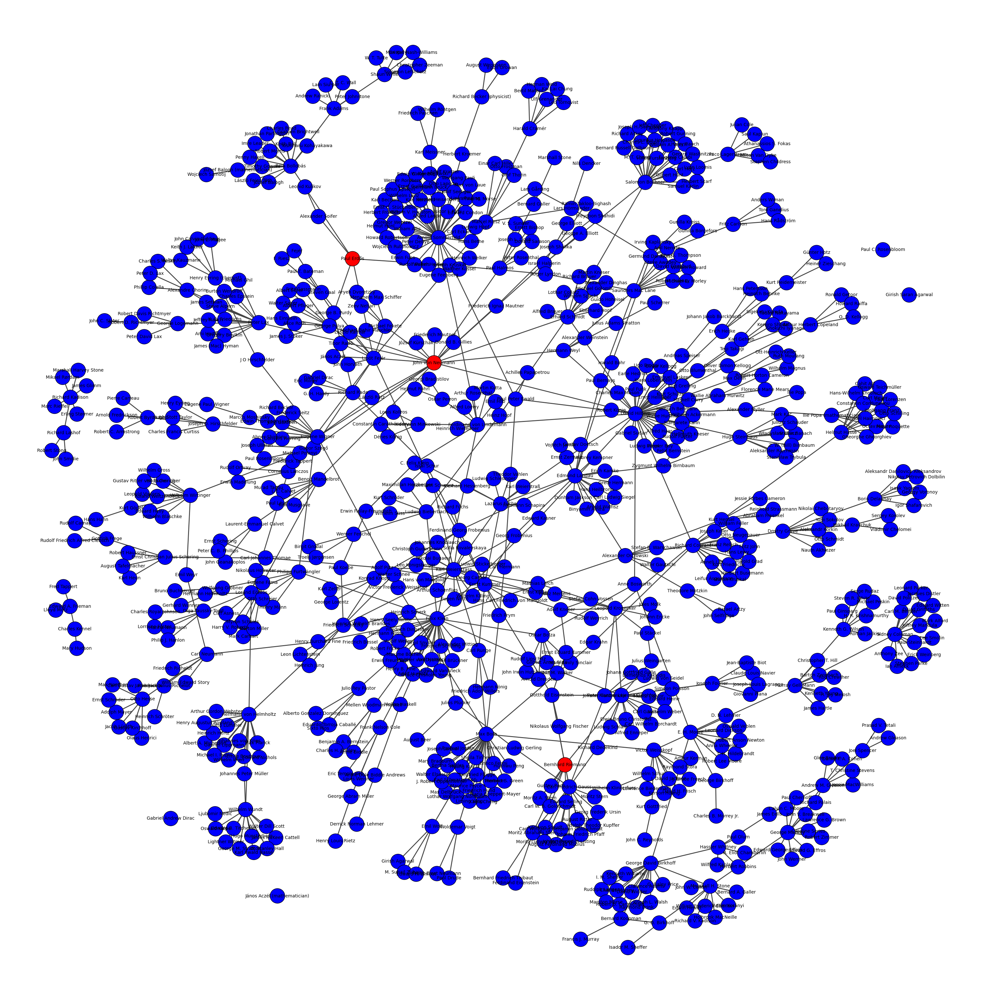

In [53]:
fig, ax = plt.subplots(figsize=(40, 40))
ig.plot(
    g,
    target=ax,
    vertex_label=g.vs['name'],
    vertex_color= df_vertices['original'].replace({True:'red',False:'blue',np.NaN: 'blue'}), # Cor dos vertices - Os links originais de vermelho
    vertex_size = 0.8,
    vertex_label_size= 10,
    layout = g.layout_fruchterman_reingold()
)
plt.show()

In [54]:
ls_colors = ['red','blue','orange','green']
ls_colors_campo = df_vertices['Campo_Principal'].replace({'Physics':ls_colors[1],'Mathematics':ls_colors[0],'Statistics':ls_colors[2],'Chemistry':ls_colors[3]})
ls_colors_campo = np.where(ls_colors_campo.isin(ls_colors), ls_colors_campo, 'grey')

fig, ax = plt.subplots(figsize=(120, 120))
ig.plot(
    g,
    target=ax,
    vertex_label=g.vs['name'],
    vertex_color= ls_colors_campo,
    vertex_size = df_vertices['original'].replace({True:1,False:0.6,np.NaN: 0.6}),
    vertex_label_size= 20
)
plt.show()

# 4. Visualizações

In [40]:
visualizacoes_trabalho = False # Essa parte eu executei apenas para salvar imagens durante a criação do grafo para apresentar. A variavel fig_save e fig_path salvam em uma pasta as imagens.
if visualizacoes_trabalho:
    ls_erd_von = [ 'https://en.wikipedia.org/wiki/Paul_Erd%C5%91s', 'https://en.wikipedia.org/wiki/John_von_Neumann']
    _,_,_ = coleta_dados(ls_erd_von, n_lk = 15, fig_save= True, fig_path= r'anim\erdos_neumann_15')

In [41]:
if visualizacoes_trabalho:
    ls_curie_med = ['https://en.wikipedia.org/wiki/Marie_Curie', 'https://en.wikipedia.org/wiki/Dmitri_Mendeleev']
    _,_,_ = coleta_dados(ls_curie_med, n_lk = 30, fig_save= True, fig_path= r'anim\curie_mendeleev_30')

In [42]:
if visualizacoes_trabalho:
    ls_knuth_turing = ['https://en.wikipedia.org/wiki/Donald_Knuth', 'https://en.wikipedia.org/wiki/Alan_Turing']
    _,_,_ = coleta_dados(ls_knuth_turing, n_lk = 100, fig_save= True, fig_path= r'anim\knuth_turing_100')

# 5. Recomendações

A recomendação é feita com base em passeios aleatórios, são escolhidos:
- n (acadêmicos iniciais para basear a recomendação)
- p (número de passos máximos de cada passeio)
- q (quantidade de passeios para cade acadêmico escolhido)
- r (quantidade de recomendações que seram feitas)

Devem ser passados os índices dos acadêmicos iniciais na busca, presente no dataframe de vertices (df_vertices)

In [45]:
def random_walk(grafo, indice_aresta_inicial, passos):
    
    arestas_visitadas = [indice_aresta_inicial]

    aresta_atual = indice_aresta_inicial

    for _ in range(passos):
        vizinhos = grafo.neighbors(aresta_atual)
        if not vizinhos:
            break  # Não há mais vizinhos, encerra a caminhada

        proxima_aresta = random.choice(vizinhos)
        arestas_visitadas.append(proxima_aresta)
        aresta_atual = proxima_aresta

    return arestas_visitadas

In [85]:
if teste: # Considerando que as sementes iniciais de busca são as bases para a recomendação
    n_pesq = len(ls_links_cenarios) # n
else:
    n_pesq = len(ls_links_ofi)
passos = 30 # p
qntd_passeios = 10 #q
rec_num = 5 #r

In [117]:
numero_passeios_visitados = []

for idx_pesq in range(n_pesq):
    for num_passeio in range(qntd_passeios):
        passeio = random_walk(g,idx_pesq,passos)
        print(passeio)
        numero_passeios_visitados.extend(list(set(passeio)))

numero_passeios_visitados = pd.Series(numero_passeios_visitados)

[0, 164, 0, 23, 0, 164, 0, 23, 0, 164, 0, 164, 0, 23, 718, 23, 25, 222, 25, 222, 25, 283, 25, 720, 25, 23, 0, 16, 710, 16, 0]
[0, 23, 0, 16, 0, 11, 22, 717, 22, 11, 278, 120, 276, 77, 276, 77, 364, 77, 363, 77, 354, 77, 361, 77, 357, 77, 358, 77, 362, 77, 276]
[0, 164, 0, 11, 15, 11, 20, 38, 129, 466, 129, 471, 129, 747, 143, 750, 143, 525, 143, 526, 143, 526, 143, 526, 143, 129, 475, 129, 472, 129, 476]
[0, 11, 200, 11, 8, 1, 701, 1, 26, 228, 26, 224, 26, 231, 26, 227, 26, 228, 26, 228, 26, 1, 8, 197, 8, 197, 8, 11, 202, 11, 278]
[0, 11, 278, 41, 14, 708, 14, 708, 14, 93, 168, 608, 168, 609, 168, 763, 168, 763, 168, 609, 168, 93, 80, 366, 120, 185, 120, 365, 80, 49, 41]
[0, 54, 310, 54, 131, 54, 313, 54, 311, 54, 317, 54, 317, 54, 318, 54, 313, 54, 311, 54, 313, 54, 310, 54, 317, 54, 315, 54, 103, 426, 103]
[0, 164, 0, 164, 620, 164, 620, 173, 620, 173, 135, 490, 135, 490, 135, 183, 135, 1, 6, 1, 11, 22, 716, 22, 716, 22, 11, 278, 41, 185, 120]
[0, 16, 0, 54, 103, 424, 103, 424, 103, 

In [131]:
qntd_visitas = numero_passeios_visitados.value_counts()
df_vertices['visitas'] = qntd_visitas

In [147]:
df_vertices.sort_values('visitas', ascending= False).query(f'idx_vertice >= {n_pesq}').head(rec_num) # Recomendações

,Nome,Ano_Nasc,Pais,Campo_Principal,link,original,idx_vertice,visitas
41,Ernst Kummer,1810.0,Germany,Mathematics,https://en.wikipedia.org/wiki/Ernst_Eduard_Kummer,False,41,8.0
11,Lipót Fejér,1880.0,Austria,Mathematics,https://en.wikipedia.org/wiki/Lip%C3%B3t_Fej%C...,False,11,8.0
93,Peter Gustav Lejeune Dirichlet,1805.0,-,Mathematics,https://en.wikipedia.org/wiki/Peter_Gustav_Lej...,False,93,7.0
120,Karl Weierstrass,1815.0,Prussia,Mathematics,https://en.wikipedia.org/wiki/Karl_Weierstra%C...,False,120,7.0
10,Moritz Abraham Stern,1807.0,-,Mathematics,https://en.wikipedia.org/wiki/Moritz_Abraham_S...,False,10,7.0


In [138]:
df_vertices.sort_values('visitas', ascending= False).head(10) # Visão Geral

,Nome,Ano_Nasc,Pais,Campo_Principal,link,original,idx_vertice,visitas
1,John von Neumann,1903.0,Austria,Mathematics,https://en.wikipedia.org/wiki/John_von_Neumann,True,1,12.0
0,Paul Erdős,1913.0,Austria,Mathematics,https://en.wikipedia.org/wiki/Paul_Erd%C5%91s,True,0,11.0
2,Bernhard Riemann,1826.0,-,Mathematics,https://en.wikipedia.org/wiki/Bernhard_Riemann,True,2,10.0
41,Ernst Kummer,1810.0,Germany,Mathematics,https://en.wikipedia.org/wiki/Ernst_Eduard_Kummer,False,41,8.0
11,Lipót Fejér,1880.0,Austria,Mathematics,https://en.wikipedia.org/wiki/Lip%C3%B3t_Fej%C...,False,11,8.0
93,Peter Gustav Lejeune Dirichlet,1805.0,-,Mathematics,https://en.wikipedia.org/wiki/Peter_Gustav_Lej...,False,93,7.0
120,Karl Weierstrass,1815.0,Prussia,Mathematics,https://en.wikipedia.org/wiki/Karl_Weierstra%C...,False,120,7.0
10,Moritz Abraham Stern,1807.0,-,Mathematics,https://en.wikipedia.org/wiki/Moritz_Abraham_S...,False,10,7.0
14,Gotthold Eisenstein,1823.0,Germany,Mathematics,https://en.wikipedia.org/wiki/Gotthold_Eisenstein,False,14,7.0
68,Carl Friedrich Gauss,1777.0,Germany,Mathematics,https://en.wikipedia.org/wiki/Carl_Friedrich_G...,False,68,6.0
